In [1]:
#TSP GA
#Generation is a list of 3 elements [weights[], values[], max_weight] 
def run_simulation_TSP_GA(param = None):
    if param:
        paramaters = param
    else:
        paramaters = init_parameters(sim_total=10000,cities_amount=30,population_size=100,percentage_elitism = 0.1, prob_crossover = 0.7, prob_mutation = 0.1)
    print('\n\n\n SIMULATION START################################# ')
    print('SIMULATION TOTAL:',paramaters[0])
    world = init_world(cities_amount=paramaters[1])
    population = init_population(world, population_size = paramaters[2])
    log_file = init_log_file(world,paramaters)
    for a in range(paramaters[0]):        
        log_file = log_values(log_file, a, population, world)
        if early_stop(log_file):
            break
        selected_indices_pop = selection(population,world,per_selected=paramaters[3])
        new_pop = crossover_ordered(selected_indices_pop,population,world,prob_cross=paramaters[4])    
        # new_pop = crossover_swap1on1(selected_indices_pop,population,world)    
        population = mutation(new_pop,prob_mut=paramaters[5])  
    # print(world)    
    print_population_evaluation(population,world,paramaters, best_only = True)
    return log_file
    
import statistics
def early_stop(logs):
    sim = logs[0]
    if len(sim) < 11:
        return False
    last_10_keys = list(sim.keys())[-10:]
    best = [sim[last_10_keys[i]][2] for i in range(len(last_10_keys))]
    # print(best)
    variance = statistics.variance(best) 
    # median = statistics.median(best)
    if variance < 0.01 and best[-1] < 2*math.pi:
        print('EARLY STOP')
        print('Sim count:',sim[last_10_keys[-1]][0])
        print(best)
        print(variance)
        # print(median)
        print(best[-1])
        print(logs[-1])
        return True
    else:
        return False

In [2]:
def create_experiments():
    #Simulation count
    simulation_total = 5000
    cities = [10,25,40]
    population_size = [10,50,100]
    # elitism = [0.1,0.2,0.6]
    # crossover = [0.5,0.7,0.9]
    # mutation = [0.05,0.1,0.15]
    elitism = [0.1,0.2]
    crossover = [0.7,0.9]
    mutation = [0.05,0.1]
    experiments = {}
    count = 0
    for c in cities:
        for p in population_size:
            for e in elitism:
                for csvr in crossover:
                    for m in mutation:
                        experiments[count] = run_simulation_TSP_GA(param = init_parameters(sim_total=simulation_total,cities_amount=c,population_size=p,percentage_elitism = e, prob_crossover =csvr, prob_mutation = m))
                        count += 1 
    # print(experiments)    
    # experiments['LAST'] = True                
    import json
    # huh = json.dumps(experiments)
    # with open('TSP_experiments.json', 'w') as outfile:
    #     outfile.write(huh)
    with open('TSP_experiments_5000.json', 'w') as outfile:
        json.dump(experiments,outfile)
    return experiments

In [3]:

# experiments_json = create_experiments() #For custom experiments look at create_experiments()

In [4]:
def plot_fitness_experiment(experiment):
    iteration_counts = experiment[0].keys()
    fitness_experiment = [experiment[0][index][-2] for index in iteration_counts]
    diversity_experiment = [experiment[0][index][-1] for index in iteration_counts]
    # figure_fit.plot(fitness_experiment)
    # plt.ylabel('Distance/Fitness, lower is better)')
    # plt.xlabel('Generations/Iterations')
    # plt.title('Fitness change over time')
    # plt.show()
    # figure_div.plot(diversity_experiment)
    # plt.ylabel('Unique amoung of genes')
    # plt.xlabel('Generations/Iterations')
    # plt.title('Gene diversity change over time')
    # plt.show()
    return fitness_experiment,diversity_experiment
    # for index in iteration_counts:
    #     print('////////////////////////START')
    #     print(index)
    #     print(experiment[0][index])
    #     print('Fitness iteration:',experiment[0][index][-2])
    #     print('Diversity in iteration: ',experiment[0][index][-1])
        

In [5]:
import matplotlib.pyplot as plt
def plot_experiments(experiments):
    keys_experiments = experiments.keys()
    count =0
    current_cities_amount = -1
    current_population_amount = -1
    current_elitism = -1
    fitness = []
    diversity = []
    for k in keys_experiments:
        if k == 'LAST':
            break
        param = experiments[k][-1]      
        if param[2] != current_population_amount or param[3] != current_elitism or param[1] != current_cities_amount:
            fitness.append([])
            diversity.append([])         
        
        current_cities_amount = param[1]
        current_population_amount = param[2]
        current_elitism = param[3]
        print('Paramenters: ',param)

        f, d = plot_fitness_experiment(experiments[k])
        fitness[-1].append(f)
        diversity[-1].append(d)

    import numpy as np
    import seaborn as sns
    labels = ['Crossover: 0.7, Mutation: 0.05','Crossover: 0.7, Mutation: 0.1','Crossover: 0.9, Mutation: 0.05','Crossover: 0.9, Mutation: 0.1']
    nodes_values = [10,25,40]
    pop_size = [10,50,100]    
    elitism_values = ['10%','20%']
    nodes_count = -1
    pop_count = -1
    e_count = -1
    for j in range(len(fitness)):
        f, (ax1, ax2) = plt.subplots(2,1,figsize=(15,15))
        nodes_count = nodes_count+1 if j%6 == 0 else nodes_count 
        e_count = (e_count+1)%2 if j%3 ==0 else e_count
        for i in range(len(fitness[j])):        
            pop_count = (pop_count+1)%3 if i%8 == 0 else pop_count
            title = 'Graph ('+str(j) +'). Cities amount '+str(nodes_values[nodes_count])+', Population is '+str(pop_size[pop_count]) + ', Elitism is ' + elitism_values[e_count]
            ax1.plot(fitness[j][i], label=labels[i])
            ax1.legend()
            ax1.set_ylabel('Distance/Fitness (lower is better)')
            ax1.set_xlabel('Generations/Iterations')                  
            ax1.set_title(title+'. Fitness change over time ')
        for i in range(len(diversity[j])):
            ax2.plot(diversity[j][i],label=labels[i])
            ax2.legend()
            ax2.set_ylabel('Unique amount of genes')
            ax2.set_xlabel('Generations/Iterations')
            ax2.set_title(title +'. Gene diversity change over time')
        f.savefig('TSP Graphs/'+title+'.png',bbox_inches ='tight')



In [6]:
#TO measure:
###Simulation amount
###Population amount
###Change of diversity through time of the population
###Change of fitness through time
###Amount of cities / Amount of items in knapsack

###Compare crossovers
###Compare different probabilities of mutation
###Compare amount of elitism selection
###Maybe not but compare prob of crossover

##Logfile structure
##simulation = [sim_index, population_at_sim_index, best_fitness, diversity_amount]
##log_file[simulations[],world[x,y],parameters[]]
#Diversity_amount is the amount of unique individuals in the current population
def init_parameters(sim_total=50, cities_amount=10, population_size=100,percentage_elitism = 0.1, prob_crossover = 0.7, prob_mutation = 0.05):
    return [sim_total, cities_amount, population_size,percentage_elitism, prob_crossover, prob_mutation]
def init_log_file(world,parameters):
    log_file = [{},world,parameters]
    return log_file
def log_values(log_file, sim_index,current_population,world, light_logs =True):
    best_fitness, best_individual = get_best_fitness(current_population,world)
    diversity_amount = len(set(tuple(gen) for gen in current_population))
    if light_logs:
        simulation = [sim_index, best_individual,best_fitness, diversity_amount]
    else:
        simulation = [sim_index, current_population.copy(),best_fitness, diversity_amount]
    log_file[0][sim_index]=simulation
    # print(log_file)
    return log_file

def get_best_fitness(population,world):
    values = [evaluation(gen,world) for gen in population]
    sorted_indices = sorted(range(len(values)), key=lambda i:values[i],reverse=False)
    ind = population[sorted_indices[0]]
    best_fitness = evaluation(ind, world)
    return best_fitness, ind


In [7]:
import random
def init_world(cities_amount=10,seed=13579, sim_total = 10):    
    random.seed(seed)
    theta = np.linspace(0, 2*np.pi, cities_amount+1)
    theta = theta[:-1]#since last position is same as 0, we remove it
    r = np.sqrt(1.0)
    x_list = r*np.cos(theta)
    y_list = r*np.sin(theta)    
    # cities = random.sample(range(0,max_i_weight),items_Amount)    
    return [list(x_list),list(y_list)]
def init_population(world, population_size = 10):
    size = len(world[0])#Get amount of cities
    #genes are paths, so include every city once in random order
    genes = [random.sample(range(0,size),size) for i in range(population_size)]
    return genes

In [8]:
import math
def evaluation(genes, world):
    x_list, y_list = world
    dist = 0
    for i in range(len(genes)-1):
        a = genes[i] 
        b = genes[i+1]
        dist += math.sqrt(((x_list[a]-x_list[b])**2) +((y_list[a]-y_list[b])**2))
    # print(dist)
    return dist 

In [9]:
def selection(pop, world, sel_type = 'elitism',per_selected = 0.05):
    # print(per_selected)
    # print(len(pop))
    amount_elite= int(len(pop)*per_selected) 
    # print(amount_elite)
    values = [evaluation(gen,world) for gen in pop]
    # print(values)
    #Reverse false since we want to minimize distance
    sorted_genes_from_pop = sorted(range(len(values)), key=lambda i:values[i],reverse=False)
    # print(sorted_genes_from_pop)
    selected_indices_pop = sorted_genes_from_pop[:amount_elite]
    # print('selected',selected_indices_pop)
    return selected_indices_pop

def crossover_swap1on1(pop_indices, pop,  world, prob_cross = 0.8, prob_gene = 0.5):
    amount = len(pop)    
    new_pop = []
    for j in range(int(amount/2)): #NOTE: Dividing by two will be a problem if amount is not even
        parent_a = random.choice(pop_indices) #choose randomly the index of an individual that has been selected
        no_duplicates = [e for e in pop_indices if e is not parent_a]
        # no_duplicates =  pop_indices.copy()#Avoid duplicates
        # del no_duplicates[no_duplicates.index(parent_a)]
        # print(no_duplicates)
        # print(pop_indices)
        parent_b = random.choice(no_duplicates) 
        size_genes = len(world[0])
        child_a = pop[parent_a].copy() #copy genes of population values
        child_b = pop[parent_b].copy()
        if random.random() < prob_cross: #crossover
              for i in range(size_genes):#per possible gene
                if random.random() < prob_gene: #crossover
                    #Values at current index
                    buffer_a = child_a[i] 
                    buffer_b = child_b[i]
                    #Get index in parent a of value at index i in parent b                
                    index_a = child_a.index(buffer_b)
                    index_b = child_b.index(buffer_a)
                    #switch values
                    child_a[i] = buffer_b
                    child_b[i] = buffer_a  
                    #Fill the other 2 values to have a complete path
                    child_a[index_a] = buffer_a
                    child_b[index_b] = buffer_b  

        new_pop.append(child_a)
        new_pop.append(child_b)
    # print(new_pop)
    return new_pop

#Randomly select a position an amount of genes to be crossover, then add from the other parent in the same order as available their genes
#Crossover idea taken from http://www.theprojectspot.com/tutorial-post/applying-a-genetic-algorithm-to-the-travelling-salesman-problem/5, no code was used from there.
def crossover_ordered(pop_indices, pop,  world, prob_cross = 0.8, prob_gene = 0.5):
    amount = len(pop)    
    new_pop = []
    for j in range(int(amount/2)): #NOTE: Dividing by two will be a problem if amount is not even
        parent_a = random.choice(pop_indices) #choose randomly the index of an individual that has been selected
        no_duplicates = [e for e in pop_indices if (e is not parent_a) or len(pop_indices) is 1] #len(pop_indices)>1 if pop is 10 and elitism is 10%
        # no_duplicates =  pop_indices.copy()#Avoid duplicates
        # del no_duplicates[no_duplicates.index(parent_a)]
        # print(no_duplicates)
        # print(pop_indices)
        parent_b = random.choice(no_duplicates) #Select a different parent than a
        size_genes = len(world[0])
        child_a = pop[parent_a].copy() #copy genes of population values
        child_b = pop[parent_b].copy()
        if random.random() < prob_cross: #crossover
            index_start = random.randint(0,size_genes-1)            
            amount_a = random.randint(1,size_genes-index_start) #Could loop the list but this is faster
            indices_selected = range(index_start,amount_a)
            #NOTE to self: Can optimize the crossover
            child_b_buffer = pop[parent_b].copy() #Create a copy where we will mark with -1 if we used the city already
            selected_cities= [child_a[city_index] for city_index in indices_selected]
            for i in range(size_genes): #Go through all the genes in a                
                if i not in indices_selected: #If this gene wasnt selected to stay then
                    for k in range(size_genes): #Go through every gene in b
                        #NOTE for later: Maybe check if pop is faster than reasign value and if
                        if ((child_b_buffer[k] is not -1) and (child_b_buffer[k] not in selected_cities)) : #check if we havent use this gene
                            child_a[i] = child_b_buffer[k] #first unused gene is added to child a at i
                            child_b_buffer[k] = -1 #mark as used 
                            break
            #Same as above
            child_a_buffer = pop[parent_a].copy() 
            selected_cities= [child_b[city_index] for city_index in indices_selected]
            for i in range(size_genes):
                if i not in indices_selected:
                    for k in range(size_genes):
                        if ((child_a_buffer[k] is not -1) and (child_a_buffer[k] not in selected_cities)) :
                            child_b[i] = child_a_buffer[k]
                            child_a_buffer[k] = -1   
                            break         

        new_pop.append(child_a)
        new_pop.append(child_b)
    # print(new_pop)
    #DEBUG ONLY with cities amount of 10
    # for i in range(len(new_pop)):   
    #       if len(set(new_pop[i])) < 10:
    #           print(new_pop[i])
    #           print('index: ',i)
    #           raise Exception('Not unique path, error at crossover')
    return new_pop

#Swap two cities index within an indiv (path)                
def mutation(population, prob_mut = 0.05):
    # print('Mutatuin')
    # print(population)
    size_genes = len(population[0])
    for ind in population:
        for i in range(size_genes):
            if random.random() < prob_mut:
                # print('before mutation:\n',ind)
                index_a = random.randint(0,size_genes-1)
                index_b = int(index_a)
                while(index_a == index_b):
                    index_b = random.randint(0,size_genes-1)
                buffer = ind[index_a]
                ind[index_a] = ind[index_b]
                ind[index_b] = buffer
                # print("after\n",ind)
                # print('index',i)
    # print(population)
    #DEBUG ONLY with cities amount of 10
    # for i in range(len(population)):   
    #       if len(set(population[i])) < 10:
    #           print(population[i])
    #           print('index: ',i)
    #           raise Exception('Not unique path, error at mutation')
    return population        

In [10]:
def print_population_evaluation(pop,world,param,best_only = True):
    x_list, y_list = world
    print('\nCITIES:',len(x_list))
    print('PARAMETERS:',param)
    if best_only is False:
        for ind in pop:
            print('Indiviual:',ind)
            distance = evaluation(ind, world)
            print('Distance: '+str(distance))
    values = [evaluation(gen,world) for gen in pop]
    sorted_indices = sorted(range(len(values)), key=lambda i:values[i],reverse=False)
    print('\nBEST individual:')
    ind = pop[sorted_indices[0]]
    print('Indiviual:   ',ind)
    distance = evaluation(ind, world)
    print('Distance: '+str(distance))
    print('print_population_evaluation END////////////////////////////')
    
    graph_between_cities(ind, world)

In [11]:
import numpy as np
import matplotlib.pyplot as plt
def graph_between_cities(individual_genes_path,world):        
    x_list =world[0]
    y_list = world[1]
    fig, ax = plt.subplots()
    ax.scatter(x_list, y_list)
    len_cities = len(individual_genes_path)
    #Add labels to the cities
    for i in range(len_cities):
        ax.annotate(str(i), (x_list[i]+.05, y_list[i]+.05))
    #Plot path lines of best path/individual
    for i in range(len_cities-1):
        x =[x_list[individual_genes_path[i]], x_list[individual_genes_path[i+1]]]
        y = [y_list[individual_genes_path[i]],y_list[individual_genes_path[i+1]]]
        ax.plot(x,y)
    #Back home, last line
    x =[x_list[individual_genes_path[-1]], x_list[individual_genes_path[0]]]
    y = [y_list[individual_genes_path[-1]],y_list[individual_genes_path[0]]]
    ax.plot(x,y)

    ax.set_aspect(1)
    plt.xlim(-1.25,1.25)
    plt.ylim(-1.25,1.25)
    plt.grid(linestyle='--')

    plt.title('Path between cities', fontsize=10)
    plt.savefig("Path_between_cities.png", bbox_inches='tight')
    plt.show()

In [12]:
#Plot circle base code from
#https://www.science-emergence.com/Articles/How-to-plot-a-circle-in-python-using-matplotlib-/
#From there I experimented and added the lines between points
# import numpy as np
# import matplotlib.pyplot as plt
# theta = np.linspace(0, 2*np.pi, 10)
# r = np.sqrt(1.0)
# x_list = r*np.cos(theta)
# y_list = r*np.sin(theta)
# # print(theta)
# print(x1)
# print(x2)
# fig, ax = plt.subplots()

# ax.scatter(x1, x2)
# x =[x_list[0], x_list[1]]
# y = [y_list[0],y_list[1]]
# ax.plot(x,y)
# x =[x_list[3], x_list[1]]
# y = [y_list[3],y_list[1]]
# ax.plot(x,y)
# ax.set_aspect(1)
# plt.xlim(-1.25,1.25)
# plt.ylim(-1.25,1.25)
# plt.grid(linestyle='--')

# plt.title('How to plot a circle with matplotlib ?', fontsize=8)

# plt.savefig("plot_circle_matplotlib_01.png", bbox_inches='tight')

# plt.show()




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 20
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.1, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [2, 1, 0, 9, 8, 7, 6, 5, 4, 3]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


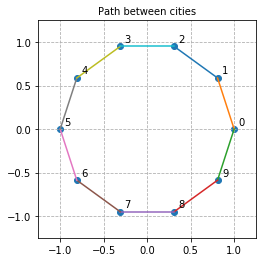




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 31
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.1, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [3, 2, 1, 0, 9, 8, 7, 6, 5, 4]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


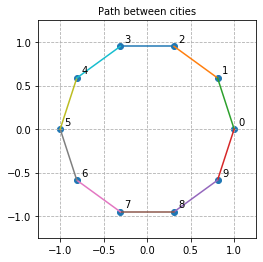




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 21
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.1, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [2, 1, 0, 9, 8, 7, 6, 5, 4, 3]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


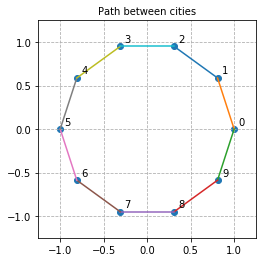




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 18
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.1, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [2, 1, 0, 9, 8, 7, 6, 5, 4, 3]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


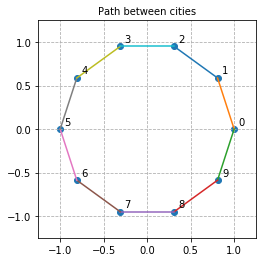




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 39
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.2, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [2, 1, 0, 9, 8, 7, 6, 5, 4, 3]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


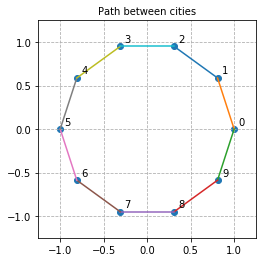




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 81
[6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106, 6.119842414584106]
0.0
6.119842414584106
[5000, 10, 10, 0.2, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [5, 4, 6, 7, 8, 9, 0, 1, 2, 3]
Distance: 6.119842414584106
print_population_evaluation END////////////////////////////


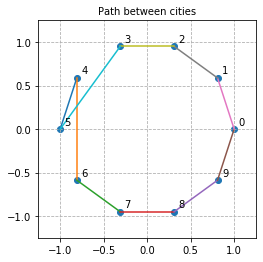




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 22
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 10, 0.2, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [2, 1, 0, 9, 8, 7, 6, 5, 4, 3]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


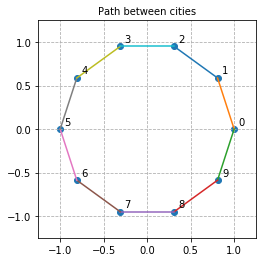




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 78
[6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105, 6.119842414584105]
0.0
6.119842414584105
[5000, 10, 10, 0.2, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 10, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [8, 7, 6, 5, 4, 3, 2, 1, 9, 0]
Distance: 6.119842414584105
print_population_evaluation END////////////////////////////


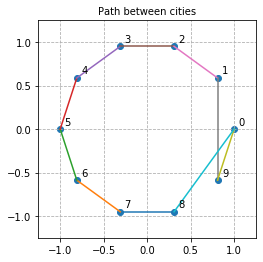




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 18
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.1, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


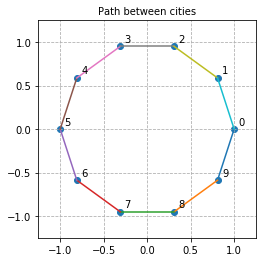




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 15
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.1, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


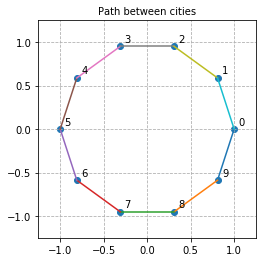




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 18
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.1, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


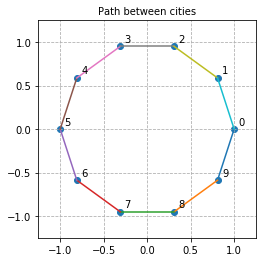




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 19
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.1, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


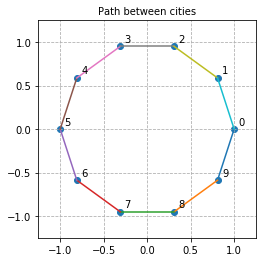




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 22
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.2, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


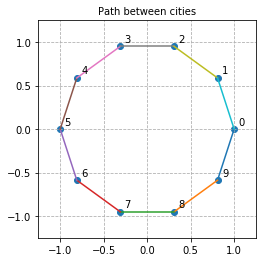




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 17
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.2, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


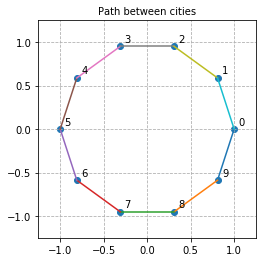




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 21
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.2, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


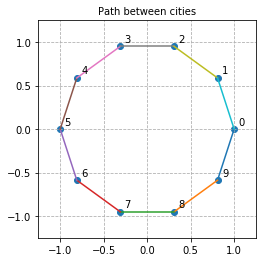




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 19
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 50, 0.2, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 50, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [4, 3, 2, 1, 0, 9, 8, 7, 6, 5]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


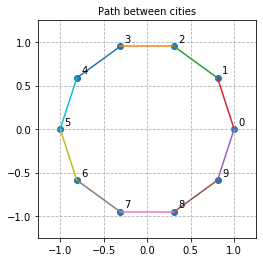




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 14
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.1, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


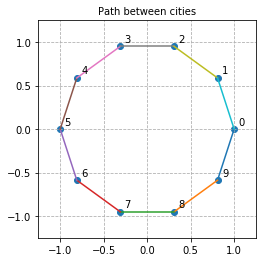




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 15
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.1, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


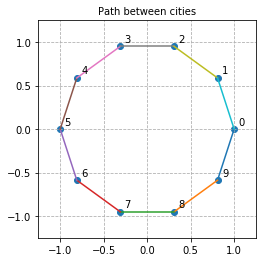




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 15
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.1, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


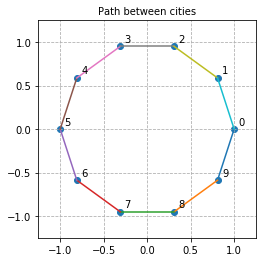




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 14
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.1, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


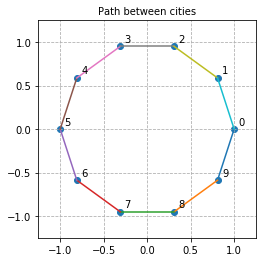




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 16
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.2, 0.7, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


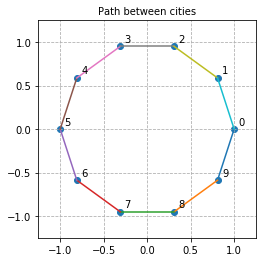




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 19
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.2, 0.7, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


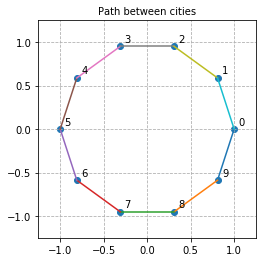




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 13
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.2, 0.9, 0.05]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


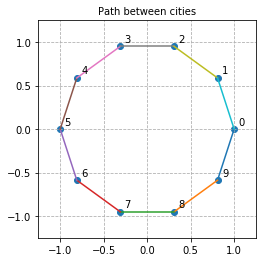




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 16
[5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054, 5.562305898749054]
0.0
5.562305898749054
[5000, 10, 100, 0.2, 0.9, 0.1]

CITIES: 10
PARAMETERS: [5000, 10, 100, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [0, 9, 8, 7, 6, 5, 4, 3, 2, 1]
Distance: 5.562305898749054
print_population_evaluation END////////////////////////////


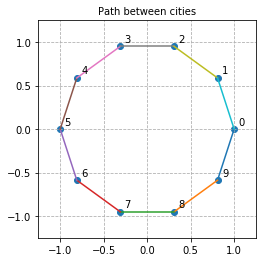




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 3808
[6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605, 6.015995211086605]
0.0
6.015995211086605
[5000, 25, 10, 0.1, 0.7, 0.05]

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]
Distance: 6.015995211086605
print_population_evaluation END////////////////////////////


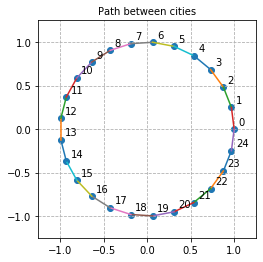




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [3, 0, 4, 2, 9, 14, 8, 10, 7, 6, 5, 22, 23, 1, 13, 11, 12, 18, 19, 21, 17, 20, 24, 16, 15]
Distance: 20.15718693889409
print_population_evaluation END////////////////////////////


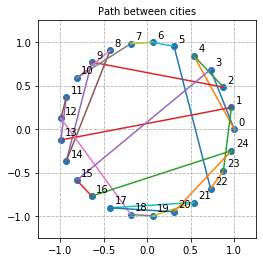




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 2395
[6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035, 6.0159952110866035]
0.0
6.0159952110866035
[5000, 25, 10, 0.1, 0.9, 0.05]

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [17, 18, 19, 20, 21, 22, 23, 24, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Distance: 6.0159952110866035
print_population_evaluation END////////////////////////////


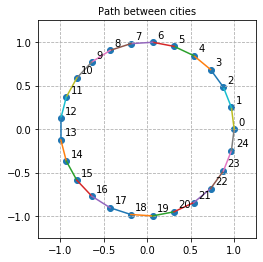




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [16, 20, 19, 18, 14, 8, 13, 15, 6, 7, 9, 1, 0, 3, 2, 10, 11, 12, 5, 4, 24, 23, 22, 21, 17]
Distance: 17.82708935057271
print_population_evaluation END////////////////////////////


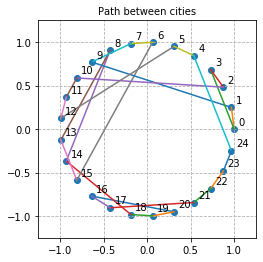




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [15, 12, 14, 13, 18, 19, 20, 16, 17, 4, 5, 3, 8, 7, 10, 9, 6, 1, 2, 11, 0, 24, 22, 23, 21]
Distance: 16.965432009917215
print_population_evaluation END////////////////////////////


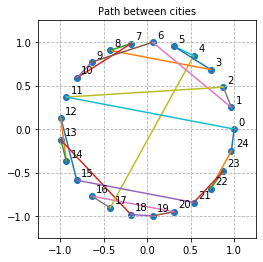




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [21, 3, 11, 9, 7, 13, 14, 18, 16, 17, 15, 22, 19, 23, 20, 0, 2, 1, 6, 8, 4, 24, 5, 10, 12]
Distance: 20.807857341204524
print_population_evaluation END////////////////////////////


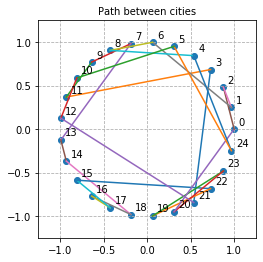




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [0, 3, 2, 1, 24, 23, 18, 17, 19, 20, 16, 15, 14, 21, 22, 9, 8, 7, 4, 5, 6, 10, 11, 12, 13]
Distance: 12.866919909727187
print_population_evaluation END////////////////////////////


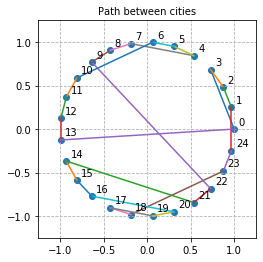




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 10, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [24, 15, 16, 17, 19, 18, 23, 4, 9, 8, 7, 5, 6, 11, 12, 13, 14, 10, 22, 2, 1, 20, 3, 0, 21]
Distance: 19.099521876568872
print_population_evaluation END////////////////////////////


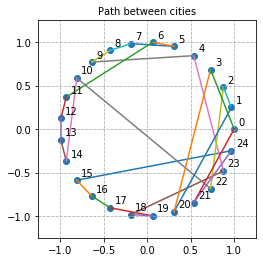




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [21, 20, 19, 13, 12, 11, 10, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 14, 15, 16, 17, 18, 22, 23, 24]
Distance: 10.423614439808231
print_population_evaluation END////////////////////////////


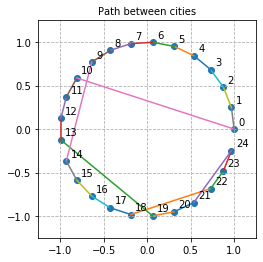




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [12, 15, 18, 17, 16, 14, 19, 20, 21, 22, 0, 23, 24, 1, 4, 2, 5, 6, 3, 8, 13, 11, 10, 9, 7]
Distance: 13.184482996106707
print_population_evaluation END////////////////////////////


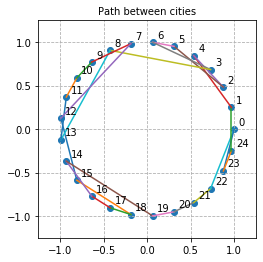




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [17, 18, 19, 20, 21, 22, 23, 24, 0, 1, 2, 3, 4, 5, 6, 7, 8, 16, 15, 14, 13, 12, 11, 10, 9]
Distance: 7.453984594962025
print_population_evaluation END////////////////////////////


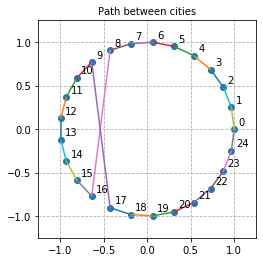




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [16, 19, 23, 24, 7, 1, 0, 2, 4, 3, 22, 21, 20, 14, 15, 18, 17, 12, 13, 11, 9, 10, 8, 5, 6]
Distance: 15.13732719840724
print_population_evaluation END////////////////////////////


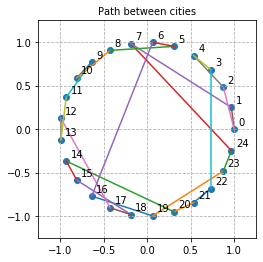




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [21, 22, 23, 24, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 17, 19, 20]
Distance: 6.509421825488804
print_population_evaluation END////////////////////////////


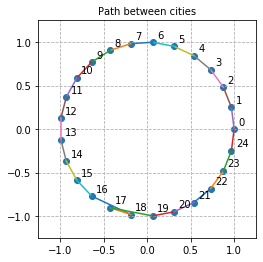




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [9, 16, 15, 17, 19, 20, 7, 6, 10, 11, 12, 13, 0, 2, 3, 4, 24, 23, 21, 14, 22, 8, 5, 1, 18]
Distance: 20.500397696119162
print_population_evaluation END////////////////////////////


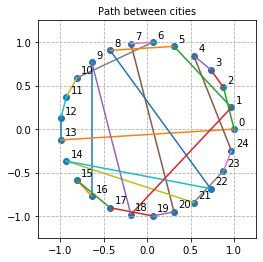




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 21, 22, 23, 24, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
Distance: 7.667441776548302
print_population_evaluation END////////////////////////////


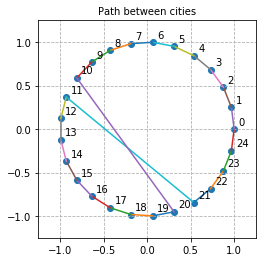




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 50, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [13, 14, 16, 12, 10, 6, 7, 11, 0, 1, 2, 8, 9, 23, 4, 3, 22, 24, 20, 21, 18, 17, 19, 15, 5]
Distance: 19.48718135181141
print_population_evaluation END////////////////////////////


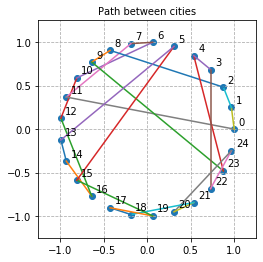




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [16, 15, 14, 13, 12, 6, 5, 4, 3, 2, 1, 0, 7, 8, 9, 10, 11, 17, 18, 19, 20, 21, 22, 23, 24]
Distance: 9.543210718967112
print_population_evaluation END////////////////////////////


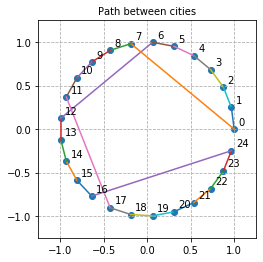




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [2, 3, 4, 5, 6, 7, 8, 9, 10, 14, 16, 12, 11, 13, 15, 17, 20, 19, 18, 22, 21, 23, 1, 0, 24]
Distance: 10.359249666798071
print_population_evaluation END////////////////////////////


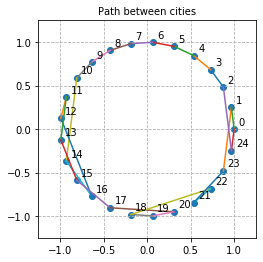




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [13, 14, 15, 16, 23, 24, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 17, 18, 19, 20, 21, 22]
Distance: 8.23125926696591
print_population_evaluation END////////////////////////////


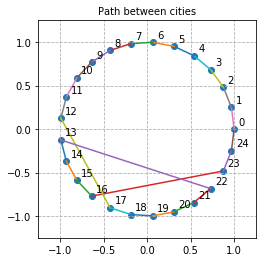




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [6, 3, 4, 5, 2, 0, 23, 20, 21, 22, 1, 24, 19, 18, 17, 14, 15, 16, 13, 11, 12, 10, 8, 9, 7]
Distance: 11.808646471229212
print_population_evaluation END////////////////////////////


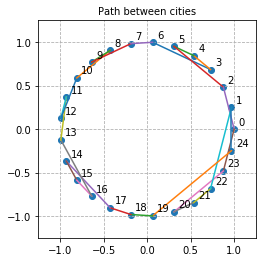




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [14, 13, 12, 11, 10, 9, 8, 3, 2, 1, 0, 24, 15, 16, 17, 18, 19, 20, 21, 22, 23, 4, 5, 6, 7]
Distance: 9.618314631075139
print_population_evaluation END////////////////////////////


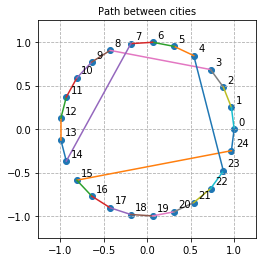




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [15, 17, 14, 12, 13, 16, 19, 21, 2, 1, 0, 20, 24, 23, 22, 4, 5, 9, 8, 7, 3, 6, 18, 10, 11]
Distance: 17.3540565030888
print_population_evaluation END////////////////////////////


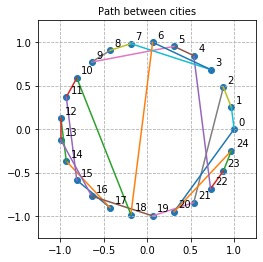




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 4, 3, 2, 1, 0, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15]
Distance: 7.6674417765483005
print_population_evaluation END////////////////////////////


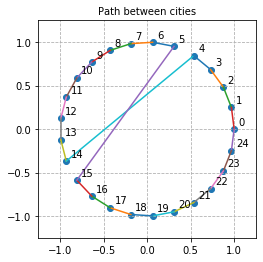




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 25
PARAMETERS: [5000, 25, 100, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [19, 21, 23, 7, 8, 1, 22, 24, 0, 2, 3, 6, 5, 4, 10, 20, 18, 17, 16, 13, 14, 9, 15, 11, 12]
Distance: 17.308962534325225
print_population_evaluation END////////////////////////////


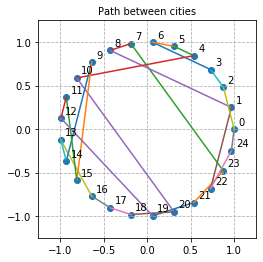




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [14, 24, 11, 10, 15, 12, 16, 19, 18, 8, 6, 3, 0, 28, 25, 33, 32, 35, 34, 17, 2, 39, 36, 31, 26, 30, 29, 37, 38, 5, 7, 9, 1, 4, 13, 27, 22, 21, 20, 23]
Distance: 28.75725317167156
print_population_evaluation END////////////////////////////


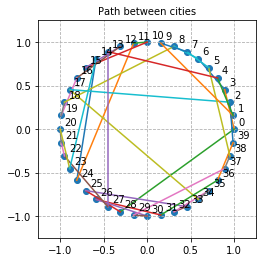




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [39, 33, 31, 32, 30, 20, 2, 25, 26, 24, 28, 29, 4, 1, 38, 0, 34, 35, 16, 22, 11, 10, 15, 5, 9, 8, 6, 12, 21, 23, 3, 13, 14, 19, 17, 18, 36, 37, 27, 7]
Distance: 33.148502606982134
print_population_evaluation END////////////////////////////


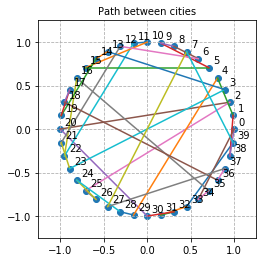




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [30, 31, 22, 20, 18, 10, 12, 14, 5, 8, 9, 15, 16, 25, 17, 13, 11, 2, 4, 37, 35, 38, 23, 34, 26, 24, 7, 6, 0, 3, 1, 36, 33, 27, 28, 29, 32, 39, 21, 19]
Distance: 28.612973617483544
print_population_evaluation END////////////////////////////


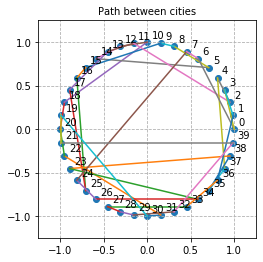




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [38, 5, 36, 33, 32, 6, 9, 8, 12, 1, 4, 3, 18, 15, 17, 35, 30, 31, 37, 25, 28, 27, 23, 20, 11, 16, 13, 14, 29, 26, 24, 22, 19, 7, 21, 34, 2, 0, 39, 10]
Distance: 32.26295522029179
print_population_evaluation END////////////////////////////


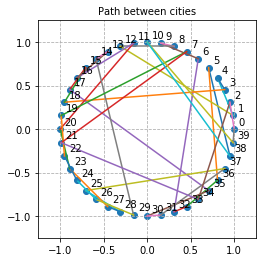




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [28, 32, 29, 39, 4, 17, 16, 14, 7, 18, 19, 21, 23, 6, 3, 1, 0, 2, 37, 36, 26, 24, 20, 34, 35, 27, 31, 33, 25, 30, 38, 22, 12, 5, 8, 9, 11, 13, 15, 10]
Distance: 29.10074469925316
print_population_evaluation END////////////////////////////


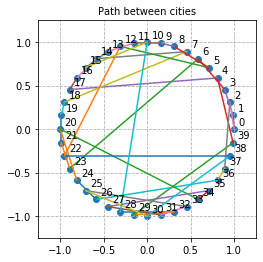




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [13, 19, 14, 23, 25, 24, 31, 9, 36, 37, 12, 11, 15, 30, 35, 5, 10, 0, 7, 28, 21, 26, 17, 16, 18, 22, 20, 6, 27, 34, 4, 8, 3, 38, 39, 2, 29, 33, 32, 1]
Distance: 37.4897801563361
print_population_evaluation END////////////////////////////


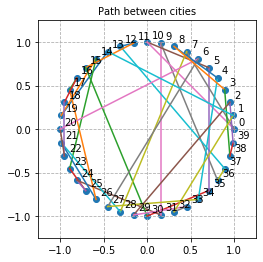




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [11, 19, 16, 14, 13, 15, 18, 9, 10, 12, 17, 3, 0, 8, 4, 39, 35, 32, 1, 34, 2, 33, 5, 6, 7, 29, 30, 21, 28, 20, 24, 23, 27, 26, 25, 22, 38, 36, 31, 37]
Distance: 29.782889853947903
print_population_evaluation END////////////////////////////


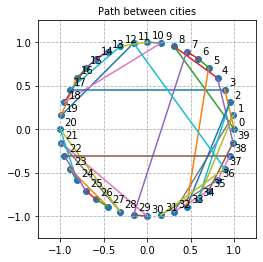




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 10, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [9, 23, 19, 22, 35, 16, 8, 3, 2, 0, 24, 20, 18, 4, 17, 21, 25, 28, 39, 38, 27, 36, 26, 32, 34, 29, 30, 33, 31, 37, 6, 7, 14, 1, 13, 12, 10, 5, 15, 11]
Distance: 35.834099913882774
print_population_evaluation END////////////////////////////


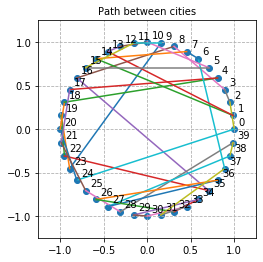




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 3893
[6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675, 6.275760205396675]
0.0
6.275760205396675
[5000, 40, 50, 0.1, 0.7, 0.05]

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [1, 0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
Distance: 6.275760205396675
print_population_evaluation END////////////////////////////


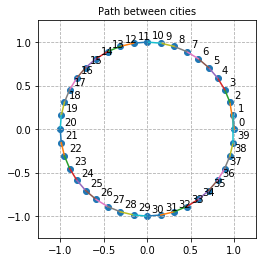




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [29, 33, 38, 9, 32, 34, 36, 8, 12, 15, 16, 14, 13, 17, 19, 18, 24, 1, 27, 28, 23, 26, 25, 21, 22, 31, 35, 0, 39, 20, 37, 2, 6, 4, 3, 7, 30, 5, 11, 10]
Distance: 30.954365368712615
print_population_evaluation END////////////////////////////


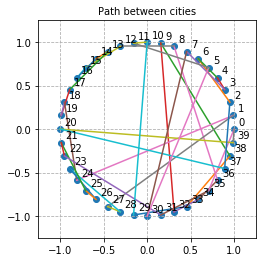




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [39, 0, 9, 14, 16, 17, 15, 12, 11, 10, 13, 8, 7, 6, 5, 4, 3, 2, 1, 38, 37, 36, 35, 34, 33, 30, 29, 27, 18, 19, 20, 21, 22, 23, 25, 24, 26, 28, 31, 32]
Distance: 12.106229736759472
print_population_evaluation END////////////////////////////


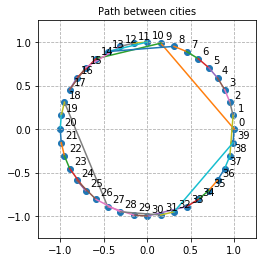




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [25, 28, 12, 15, 11, 37, 30, 29, 26, 38, 13, 14, 17, 20, 5, 2, 19, 27, 36, 34, 39, 3, 6, 7, 10, 0, 35, 32, 31, 23, 18, 22, 21, 24, 33, 8, 9, 4, 1, 16]
Distance: 33.35182557371313
print_population_evaluation END////////////////////////////


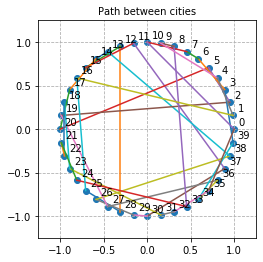




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [29, 30, 38, 37, 34, 36, 1, 4, 3, 6, 33, 31, 32, 35, 39, 5, 24, 20, 21, 22, 23, 26, 28, 27, 25, 2, 0, 16, 19, 18, 12, 14, 11, 13, 15, 17, 10, 9, 7, 8]
Distance: 21.70695684556499
print_population_evaluation END////////////////////////////


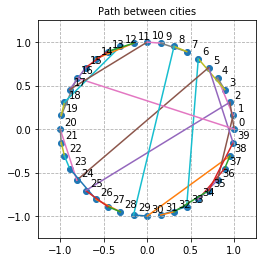




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [19, 6, 7, 0, 2, 1, 39, 38, 35, 37, 34, 29, 20, 9, 4, 17, 27, 21, 23, 3, 10, 14, 8, 15, 13, 11, 18, 16, 22, 30, 33, 25, 26, 12, 24, 31, 28, 32, 36, 5]
Distance: 32.71364891914683
print_population_evaluation END////////////////////////////


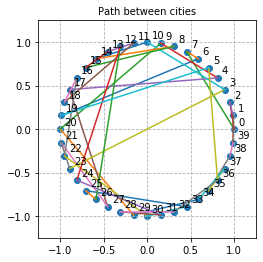




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [5, 16, 14, 7, 11, 8, 10, 9, 12, 17, 13, 6, 31, 33, 28, 29, 25, 27, 23, 24, 22, 21, 19, 15, 32, 34, 35, 36, 18, 20, 26, 30, 37, 38, 39, 1, 0, 2, 3, 4]
Distance: 22.35916843018362
print_population_evaluation END////////////////////////////


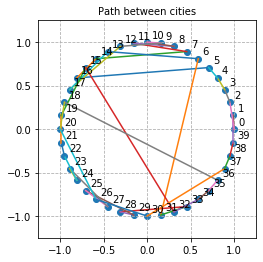




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 50, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [24, 33, 27, 29, 30, 37, 31, 11, 18, 23, 19, 22, 15, 0, 4, 1, 35, 39, 36, 28, 6, 38, 7, 34, 32, 12, 17, 16, 21, 26, 3, 5, 2, 13, 20, 10, 14, 8, 9, 25]
Distance: 37.88166784939043
print_population_evaluation END////////////////////////////


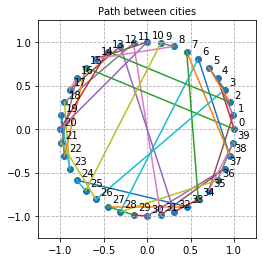




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.1, 0.7, 0.05]

BEST individual:
Indiviual:    [16, 17, 18, 34, 35, 36, 37, 5, 4, 3, 2, 1, 0, 39, 38, 33, 32, 31, 30, 29, 24, 25, 26, 27, 28, 6, 7, 8, 23, 22, 21, 20, 19, 15, 14, 13, 12, 11, 10, 9]
Distance: 14.070969128180428
print_population_evaluation END////////////////////////////


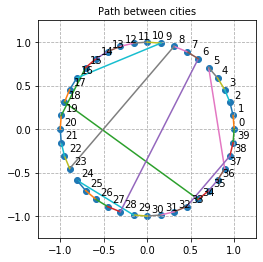




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.1, 0.7, 0.1]

BEST individual:
Indiviual:    [19, 24, 22, 23, 27, 18, 25, 20, 17, 38, 37, 32, 21, 28, 14, 1, 0, 36, 33, 39, 11, 13, 5, 6, 29, 30, 26, 31, 12, 15, 16, 9, 4, 7, 8, 10, 34, 35, 2, 3]
Distance: 31.922467337895476
print_population_evaluation END////////////////////////////


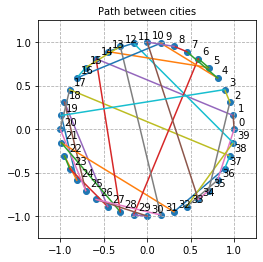




 SIMULATION START################################# 
SIMULATION TOTAL: 5000
EARLY STOP
Sim count: 4912
[6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.4317109440214475, 6.119809466771903]
0.009728253151044815
6.119809466771903
[5000, 40, 100, 0.1, 0.9, 0.05]

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.1, 0.9, 0.05]

BEST individual:
Indiviual:    [20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21]
Distance: 6.119809466771903
print_population_evaluation END////////////////////////////


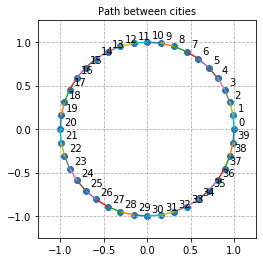




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.1, 0.9, 0.1]

BEST individual:
Indiviual:    [37, 25, 31, 26, 24, 18, 14, 17, 21, 4, 5, 6, 10, 11, 34, 38, 36, 7, 9, 13, 16, 15, 30, 32, 27, 20, 12, 8, 3, 23, 22, 19, 28, 29, 33, 1, 2, 0, 35, 39]
Distance: 29.45626444343103
print_population_evaluation END////////////////////////////


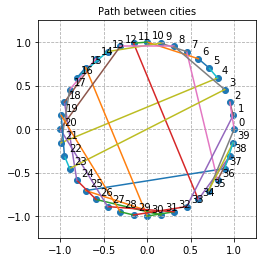




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.2, 0.7, 0.05]

BEST individual:
Indiviual:    [37, 4, 6, 39, 38, 9, 10, 13, 12, 11, 21, 20, 18, 17, 14, 7, 5, 2, 3, 22, 19, 15, 8, 16, 29, 24, 23, 27, 25, 28, 30, 26, 33, 0, 1, 36, 35, 31, 34, 32]
Distance: 24.33030331669441
print_population_evaluation END////////////////////////////


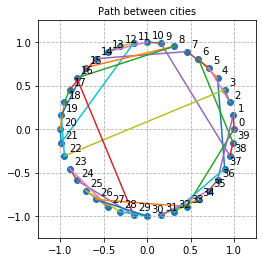




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.2, 0.7, 0.1]

BEST individual:
Indiviual:    [5, 3, 10, 11, 8, 4, 9, 6, 7, 0, 2, 31, 32, 35, 38, 37, 16, 28, 24, 21, 17, 29, 23, 39, 36, 33, 22, 19, 13, 14, 1, 27, 30, 12, 34, 25, 20, 18, 15, 26]
Distance: 34.11429128545235
print_population_evaluation END////////////////////////////


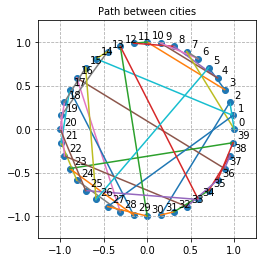




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.2, 0.9, 0.05]

BEST individual:
Indiviual:    [35, 36, 37, 34, 1, 0, 27, 39, 4, 8, 6, 5, 2, 38, 32, 33, 31, 30, 29, 25, 20, 21, 24, 28, 26, 18, 7, 10, 11, 23, 22, 17, 15, 16, 19, 13, 9, 3, 12, 14]
Distance: 23.716735899436497
print_population_evaluation END////////////////////////////


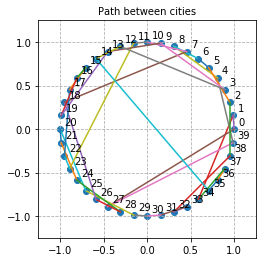




 SIMULATION START################################# 
SIMULATION TOTAL: 5000

CITIES: 40
PARAMETERS: [5000, 40, 100, 0.2, 0.9, 0.1]

BEST individual:
Indiviual:    [35, 33, 5, 9, 6, 10, 0, 2, 14, 16, 13, 24, 26, 28, 27, 32, 12, 15, 1, 38, 4, 31, 30, 7, 23, 25, 29, 34, 37, 3, 36, 8, 11, 21, 22, 19, 20, 17, 18, 39]
Distance: 33.17404712368861
print_population_evaluation END////////////////////////////


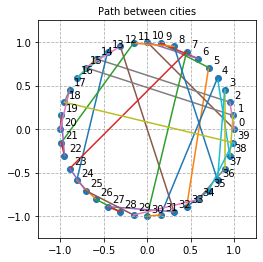


     29,
     32,
     28,
     30,
     33,
     6,
     0,
     37,
     8,
     4,
     27],
    31.732776907611488,
    100],
   955: [955,
    [9,
     24,
     3,
     2,
     18,
     20,
     21,
     26,
     27,
     25,
     38,
     8,
     23,
     22,
     7,
     19,
     17,
     14,
     15,
     12,
     6,
     4,
     39,
     35,
     31,
     13,
     11,
     16,
     10,
     36,
     5,
     1,
     34,
     33,
     32,
     28,
     30,
     29,
     0,
     37],
    32.91627750522683,
    100],
   956: [956,
    [7,
     39,
     25,
     18,
     26,
     22,
     23,
     24,
     11,
     12,
     16,
     17,
     33,
     34,
     35,
     2,
     8,
     14,
     15,
     13,
     19,
     20,
     10,
     4,
     37,
     31,
     36,
     21,
     3,
     38,
     1,
     32,
     30,
     28,
     29,
     9,
     0,
     6,
     5,
     27],
    33.87542412658257,
    100],
   957: [957,
    [14,
     8,
     18,
     7,
     27,
     20,
     24

In [13]:
# run_simulation_TSP_GA()
create_experiments()

Paramenters:  [5000, 10, 10, 0.1, 0.7, 0.05]
Paramenters:  [5000, 10, 10, 0.1, 0.7, 0.1]
Paramenters:  [5000, 10, 10, 0.1, 0.9, 0.05]
Paramenters:  [5000, 10, 10, 0.1, 0.9, 0.1]
Paramenters:  [5000, 10, 10, 0.2, 0.7, 0.05]
Paramenters:  [5000, 10, 10, 0.2, 0.7, 0.1]
Paramenters:  [5000, 10, 10, 0.2, 0.9, 0.05]
Paramenters:  [5000, 10, 10, 0.2, 0.9, 0.1]
Paramenters:  [5000, 10, 50, 0.1, 0.7, 0.05]
Paramenters:  [5000, 10, 50, 0.1, 0.7, 0.1]
Paramenters:  [5000, 10, 50, 0.1, 0.9, 0.05]
Paramenters:  [5000, 10, 50, 0.1, 0.9, 0.1]
Paramenters:  [5000, 10, 50, 0.2, 0.7, 0.05]
Paramenters:  [5000, 10, 50, 0.2, 0.7, 0.1]
Paramenters:  [5000, 10, 50, 0.2, 0.9, 0.05]
Paramenters:  [5000, 10, 50, 0.2, 0.9, 0.1]
Paramenters:  [5000, 10, 100, 0.1, 0.7, 0.05]
Paramenters:  [5000, 10, 100, 0.1, 0.7, 0.1]
Paramenters:  [5000, 10, 100, 0.1, 0.9, 0.05]
Paramenters:  [5000, 10, 100, 0.1, 0.9, 0.1]
Paramenters:  [5000, 10, 100, 0.2, 0.7, 0.05]
Paramenters:  [5000, 10, 100, 0.2, 0.7, 0.1]
Paramenters:  [

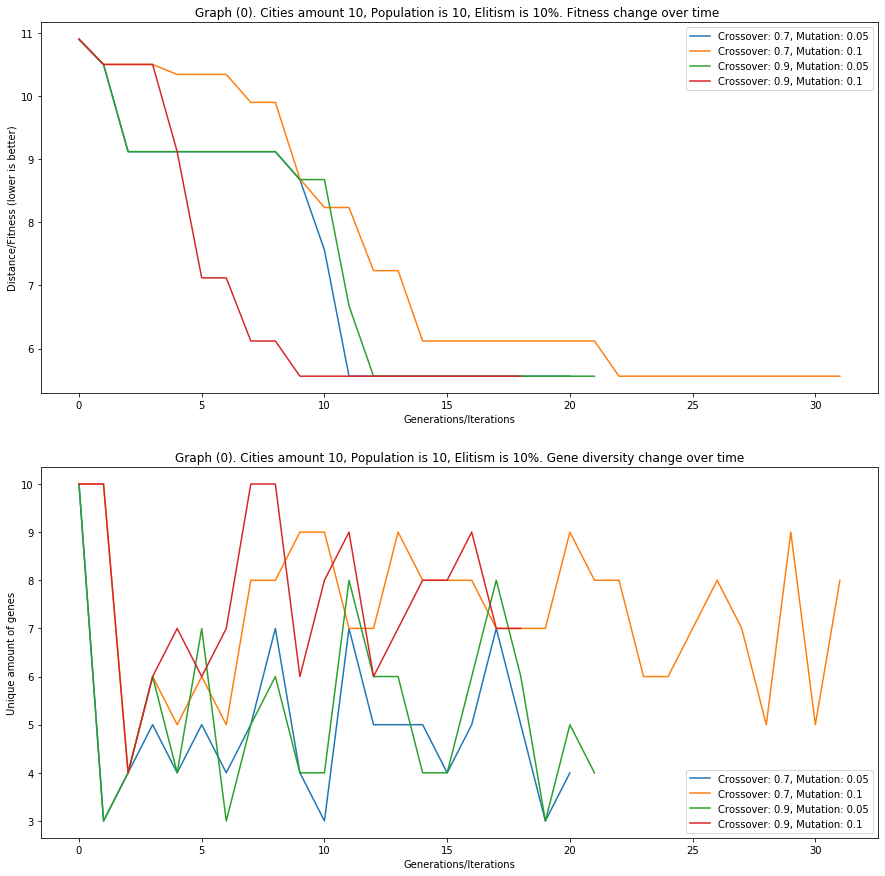

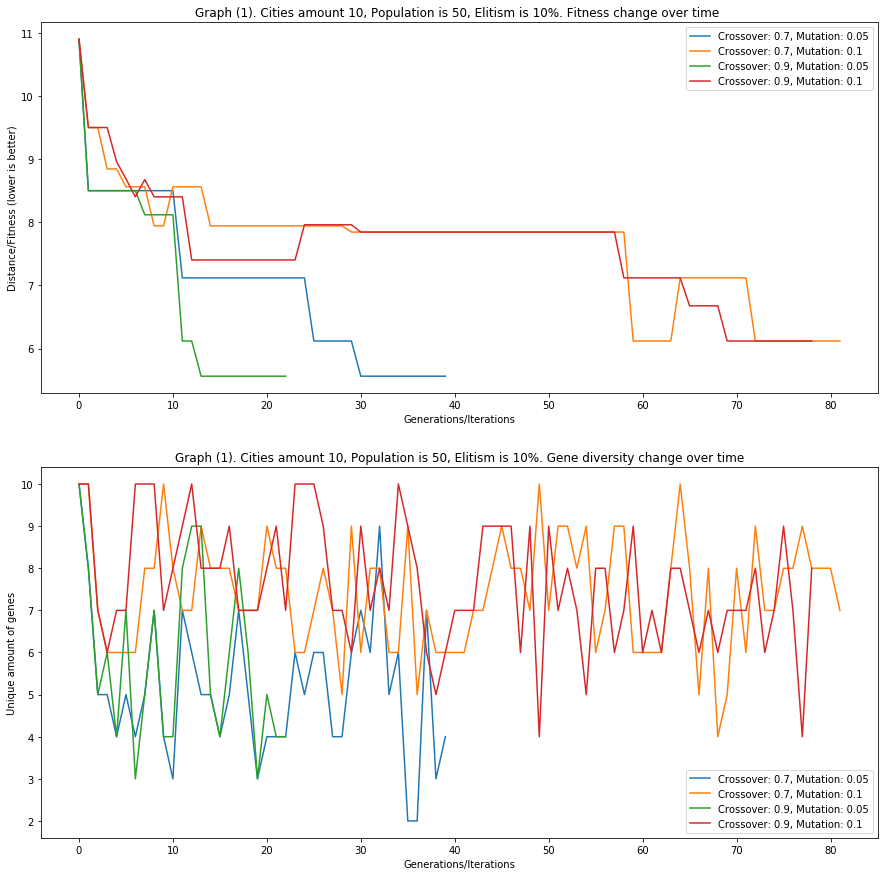

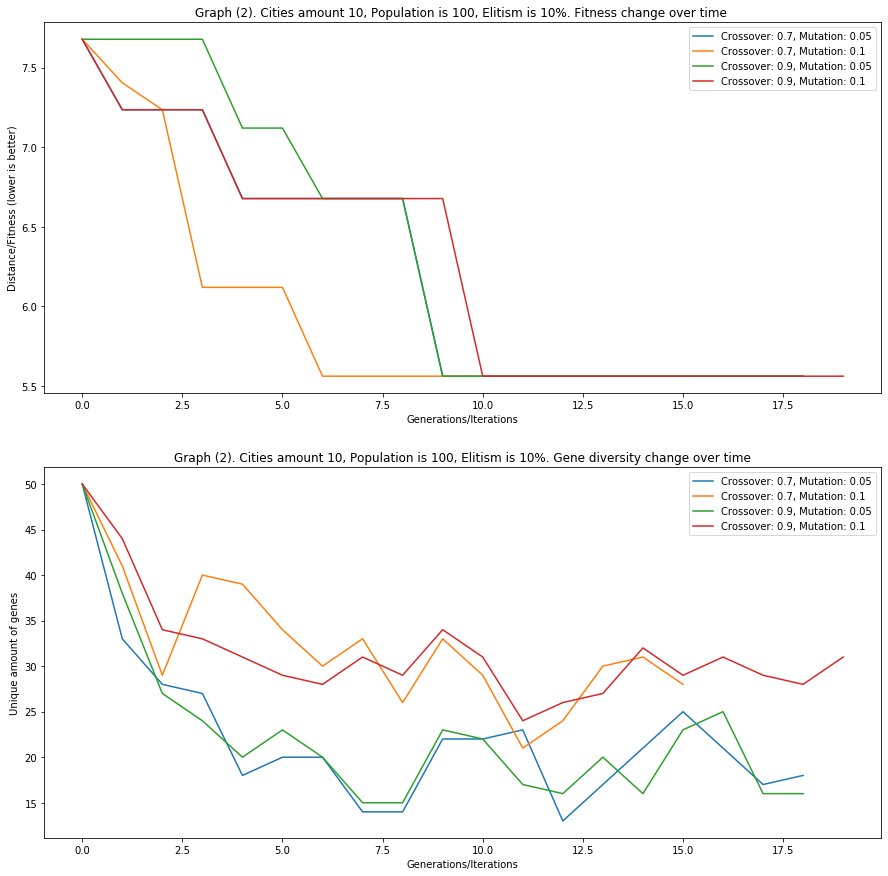

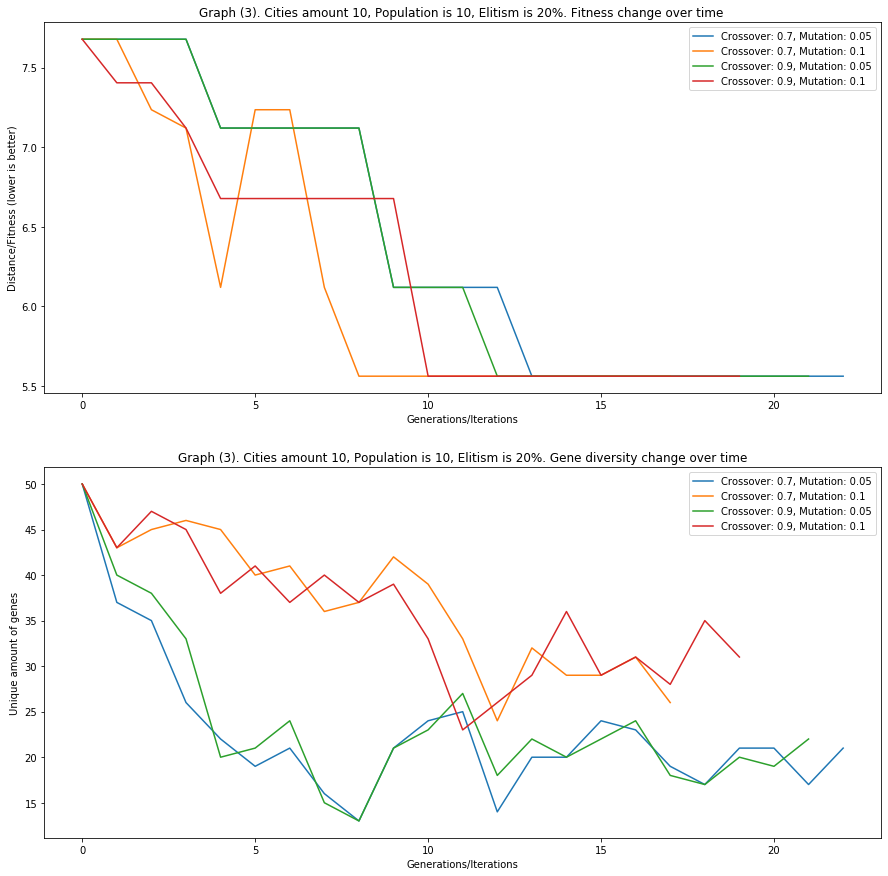

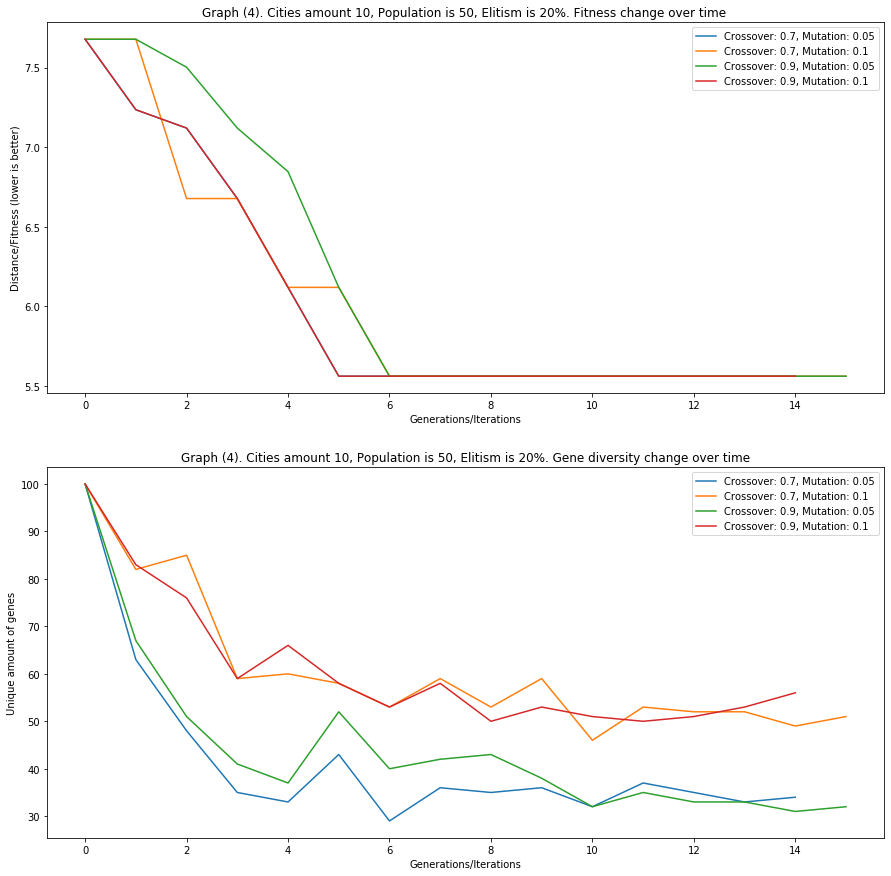

...

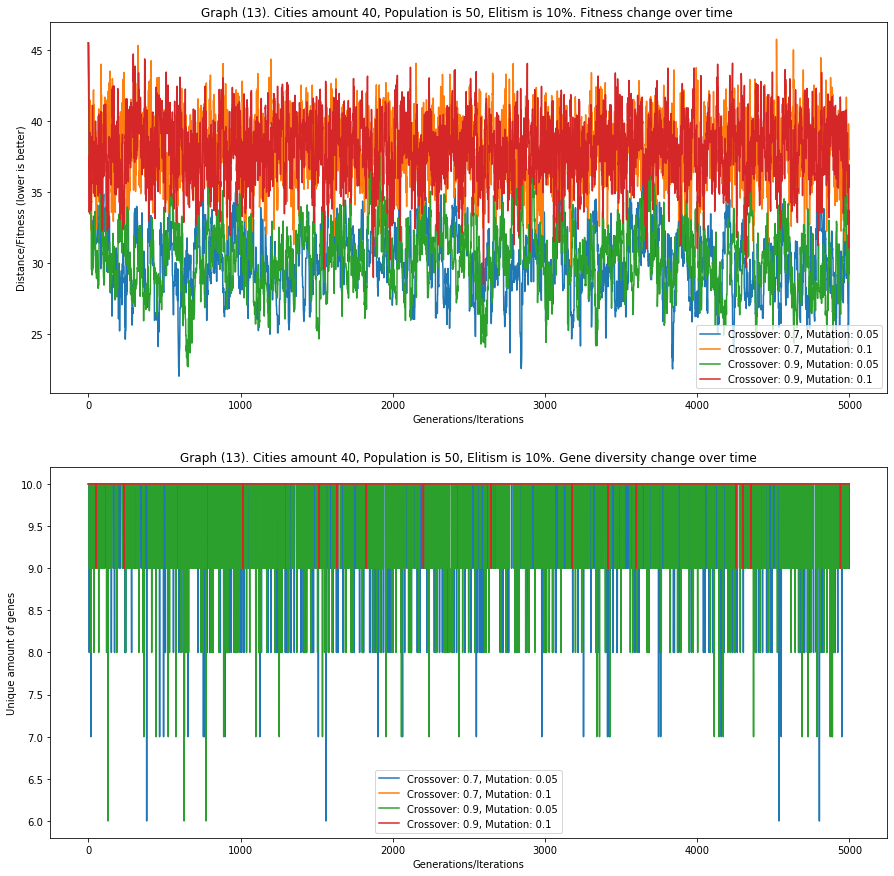

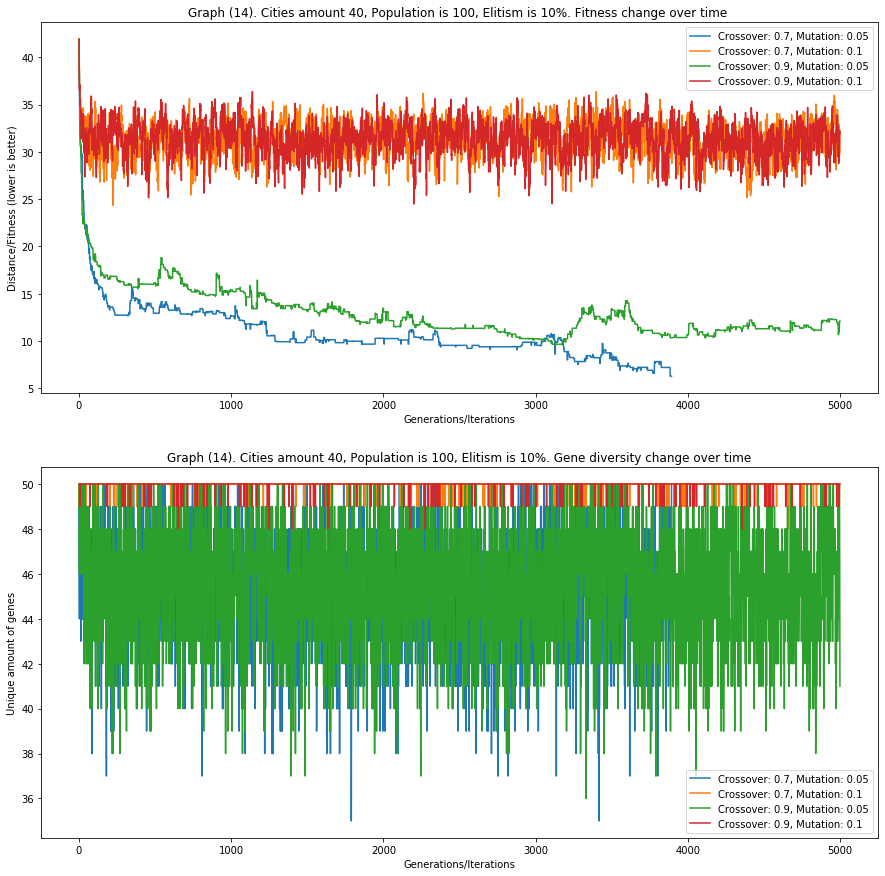

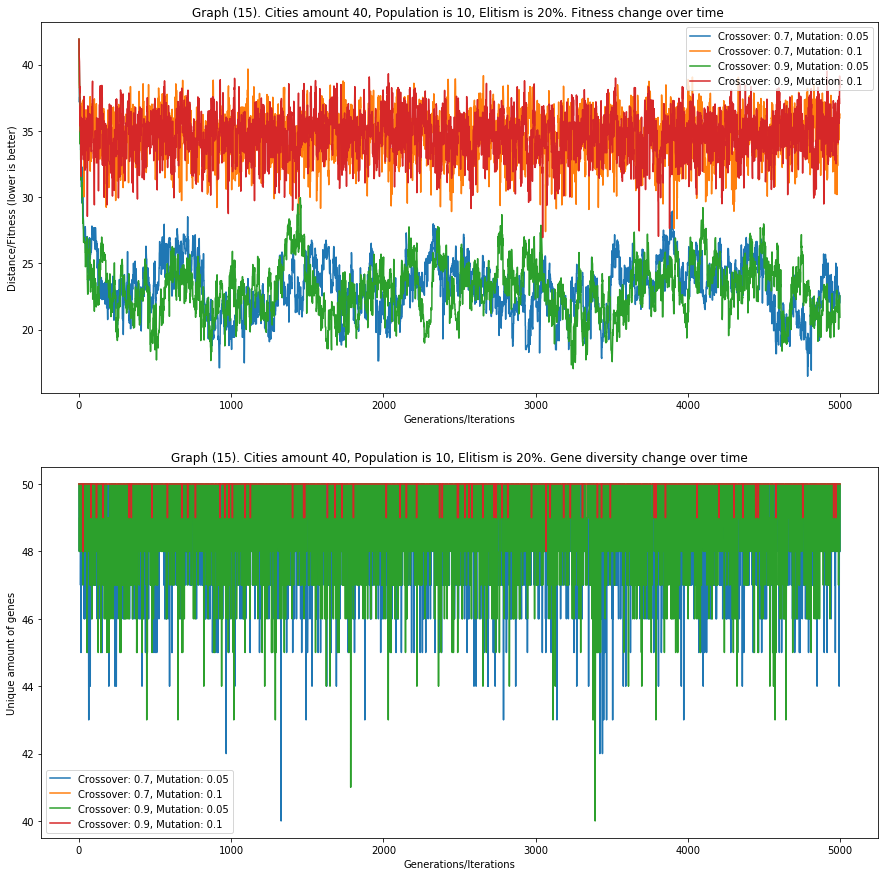

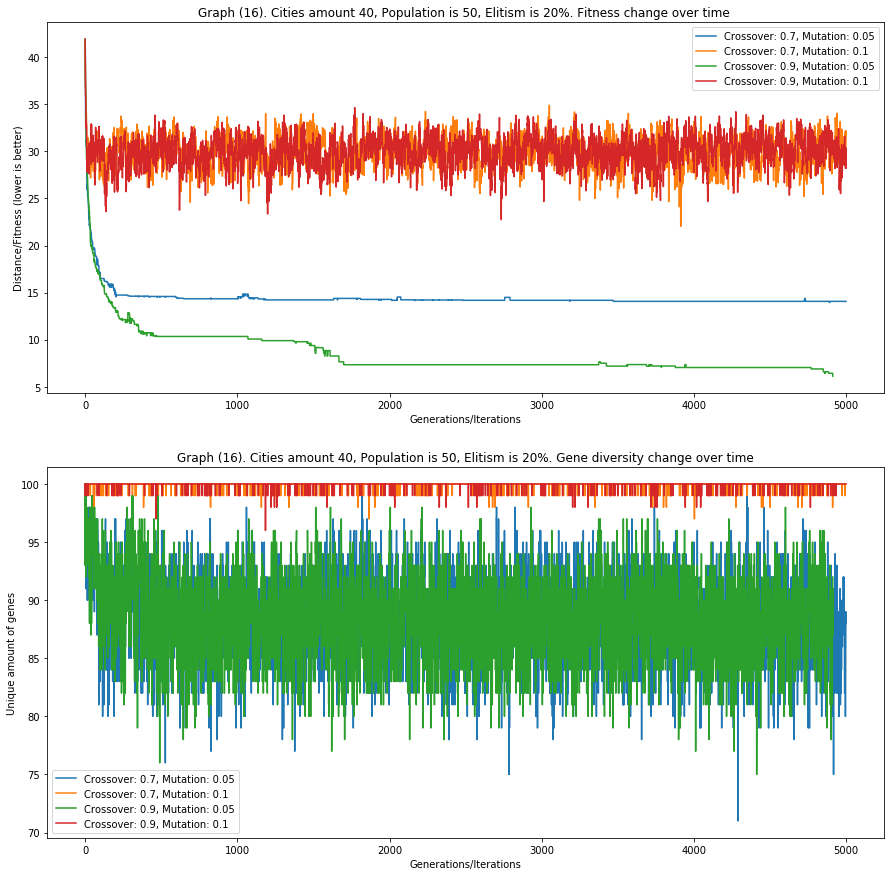

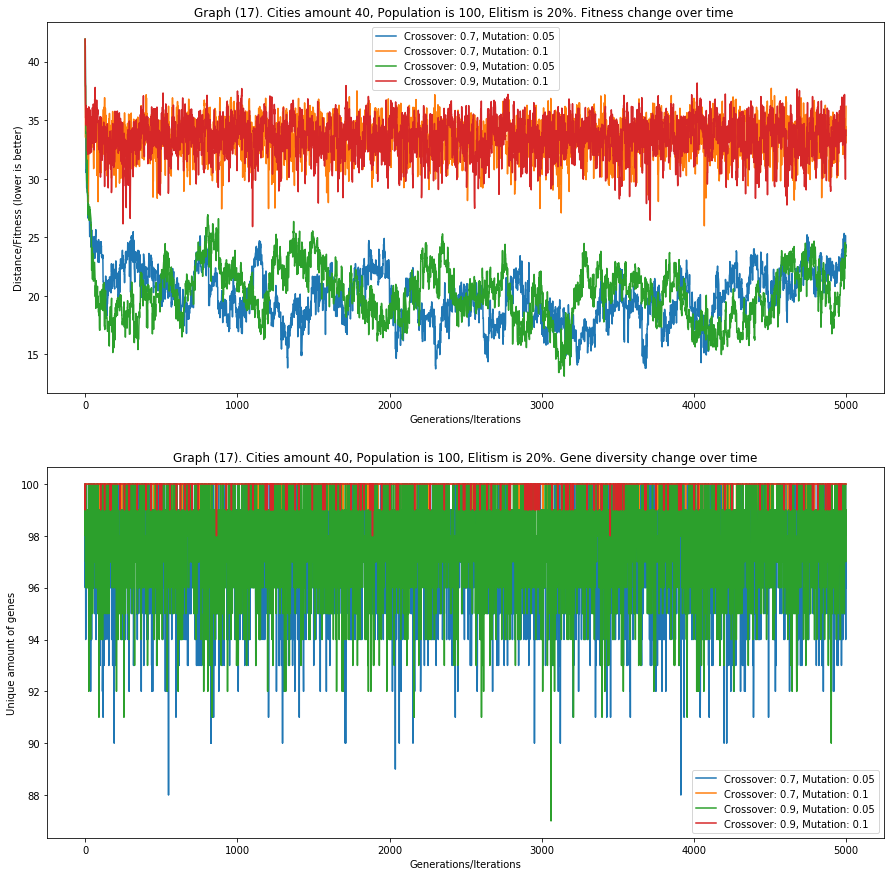

In [14]:
import json 
def read_experiments(filename = 'TSP_experiments_5000.json'):
    with open(filename) as json_file:
        experiments = json.load(json_file)
    return experiments
experiments_json = read_experiments()
plot_experiments(experiments_json)